In [81]:
import pandas as pd
import numpy as np

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

In [83]:
crimeData=pd.read_csv('mergedCrime.csv')

In [84]:
crimeData.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE
0,1,GO-2004111878,1/3/2004 5:00:00 AM,2004.0,January,3.0,Saturday,3.0,Other,Homicide,NaN,-79.392828,43.685026,098,Rosedale-Moore Park (98),NaN
1,2,GO-2004125755,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,8.0,-79.233852,43.781782,142,Woburn North (142),Morning
2,3,GO-2004136086,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,14.0,-79.205574,43.810544,146,Malvern East (146),Afternoon
3,4,GO-2004148623,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,4.0,-79.434387,43.670467,171,Junction-Wallace Emerson (171),Morning
4,5,GO-2004148619,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,0.0,-79.204958,43.822997,144,Morningside Heights (144),Night


In [86]:
duplicated_records = crimeData[crimeData.duplicated(subset=['EVENT_UNIQUE_ID'], keep=False)]

In [87]:
duplicated_records

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE


In [88]:
# lets take records only later than 2018

In [89]:
crimeDf=crimeData[crimeData["OCC_YEAR"]>=2018]

In [90]:
crimeDf.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE
858,920,GO-201817532,1/3/2018 5:00:00 AM,2018.0,January,3.0,Wednesday,3.0,Other,Homicide,NaN,-79.563174,43.681502,007,Willowridge-Martingrove-Richview (7),NaN
859,921,GO-201854152,1/9/2018 5:00:00 AM,2018.0,January,9.0,Tuesday,9.0,Shooting,Homicide,20.0,-79.517334,43.694614,008,Humber Heights-Westmount (8),Evening
860,922,GO-2018113424,1/19/2018 5:00:00 AM,2018.0,January,19.0,Friday,19.0,Shooting,Homicide,0.0,-79.569103,43.659231,011,Eringate-Centennial-West Deane (11),Night
861,924,GO-2018183793,1/29/2018 5:00:00 AM,2018.0,January,29.0,Monday,29.0,Stabbing,Homicide,NaN,-79.384563,43.664920,167,Church-Wellesley (167),NaN
862,925,GO-2018249547,2/8/2018 5:00:00 AM,2018.0,February,8.0,Thursday,39.0,Shooting,Homicide,23.0,-79.387403,43.780730,052,Bayview Village (52),Night


In [91]:
crimeDf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228458 entries, 858 to 349473
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   OBJECTID           228458 non-null  int64  
 1   EVENT_UNIQUE_ID    228458 non-null  object 
 2   OCC_DATE           228458 non-null  object 
 3   OCC_YEAR           228458 non-null  float64
 4   OCC_MONTH          228458 non-null  object 
 5   OCC_DAY            228458 non-null  float64
 6   OCC_DOW            228458 non-null  object 
 7   OCC_DOY            228458 non-null  float64
 8   OFFENCE            228458 non-null  object 
 9   MCI_CATEGORY       228458 non-null  object 
 10  OCC_HOUR           228232 non-null  float64
 11  LONG_WGS84         228458 non-null  float64
 12  LAT_WGS84          228458 non-null  float64
 13  HOOD_158           228458 non-null  object 
 14  NEIGHBOURHOOD_158  228458 non-null  object 
 15  OCC_TIME_RANGE     228232 non-null  object 
dtypes: fl

In [92]:
crimeDf.describe()

,OBJECTID,OCC_YEAR,OCC_DAY,OCC_DOY,OCC_HOUR,LONG_WGS84,LAT_WGS84
count,228458.000000,228458.000000,228458.000000,228458.000000,228232.000000,228458.000000,228458.000000
mean,262639.911038,2020.921185,15.472599,178.273354,12.539057,-78.181198,43.034456
std,80908.304204,1.931992,8.898976,104.432850,7.290003,9.765091,5.375112
min,920.000000,2018.000000,1.000000,1.000000,0.000000,-79.639247,0.000000
25%,197879.250000,2019.000000,8.000000,89.000000,6.000000,-79.475283,43.658981
50%,264508.500000,2021.000000,15.000000,174.000000,14.000000,-79.396263,43.698236
75%,330890.750000,2023.000000,23.000000,268.000000,19.000000,-79.328577,43.749402
max,396735.000000,2024.000000,31.000000,366.000000,23.000000,0.000000,43.853164


In [93]:
import pandas as pd
import folium
from folium.plugins import HeatMap


df = crimeDf.dropna(subset=['LAT_WGS84', 'LONG_WGS84'])

#lat, lng to list of tuples
crime_locations = df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

# give lat and lng for toronto
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

# Add the heatmap to toronto map
HeatMap(crime_locations,radius=10).add_to(toronto_map)



# Display the map
toronto_map


In [94]:
crimeDf["MCI_CATEGORY"].unique()

array(['Homicide', 'Assault', 'Robbery', 'Auto Theft', 'Break and Enter',
       'Theft Over'], dtype=object)

In [95]:
# Fiter for "Homicide" major crime indicator
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == 'Homicide']

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

# Give lat lng for toronto
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

# Add the heatmap 
HeatMap(crime_locations,radius=15).add_to(toronto_map)


toronto_map

In [96]:
# Filter for "Assault"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == 'Assault']

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)
HeatMap(crime_locations,radius=15).add_to(toronto_map)
toronto_map

In [97]:
# Filter for "Robbery"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == "Robbery"]
crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)
HeatMap(crime_locations,radius=10).add_to(toronto_map)

toronto_map

In [98]:
# Filter for "AutoTheft"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == "Auto Theft"]

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

HeatMap(crime_locations,radius=5).add_to(toronto_map)
toronto_map

In [99]:
columns_to_convert = ['OCC_YEAR', 'OCC_DAY', 'OCC_DOY', 'OCC_HOUR']
crimeDf[columns_to_convert] = crimeDf[columns_to_convert].apply(pd.to_numeric, errors='coerce').astype('Int64')

C:\Users\ghema\AppData\Local\Temp\ipykernel_11796\846330827.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf[columns_to_convert] = crimeDf[columns_to_convert].apply(pd.to_numeric, errors='coerce').astype('Int64')


In [100]:
crimeDf["OCC_YEAR"].max()

2024

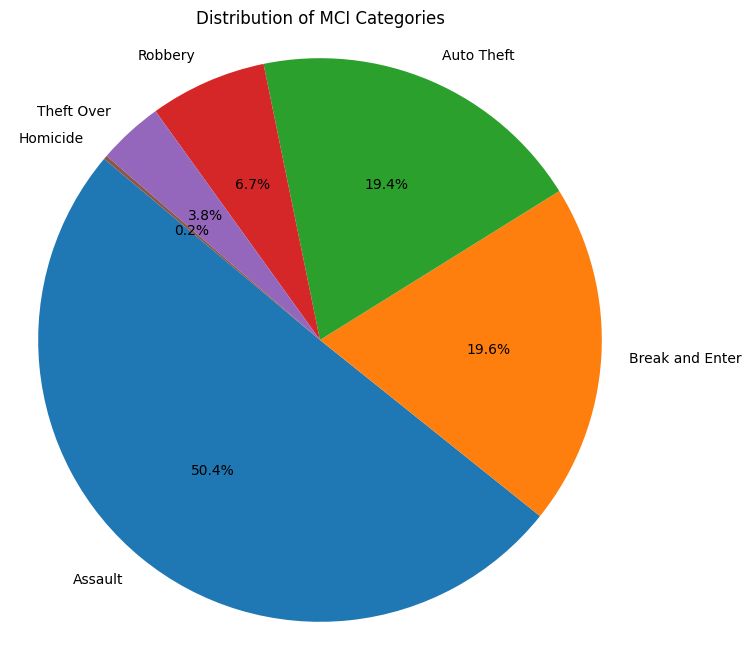

In [102]:
# Count the occurrences of each MCI_CATEGORY
mci_counts = crimeDf['MCI_CATEGORY'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(mci_counts, labels=mci_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of MCI Categories')
plt.axis('equal') 
plt.show()

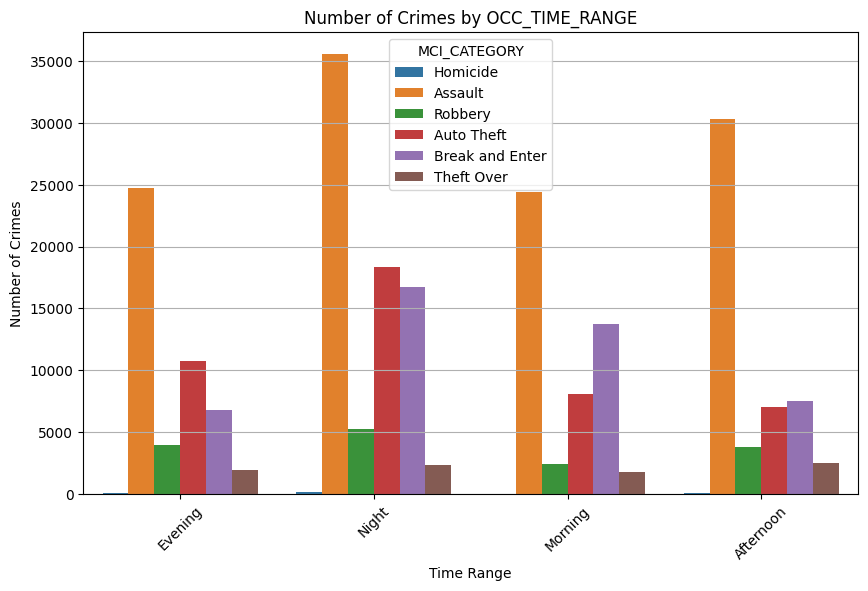

In [103]:
# count plot for crimes within time ranges
plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_TIME_RANGE',hue='MCI_CATEGORY')
plt.title('Number of Crimes by OCC_TIME_RANGE')
plt.xlabel('Time Range')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

In [110]:
crimeDf["OCC_DOW"]=crimeDf["OCC_DOW"].apply(lambda x:x.strip() )

C:\Users\ghema\AppData\Local\Temp\ipykernel_11796\3435113189.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf["OCC_DOW"]=crimeDf["OCC_DOW"].apply(lambda x:x.strip() )


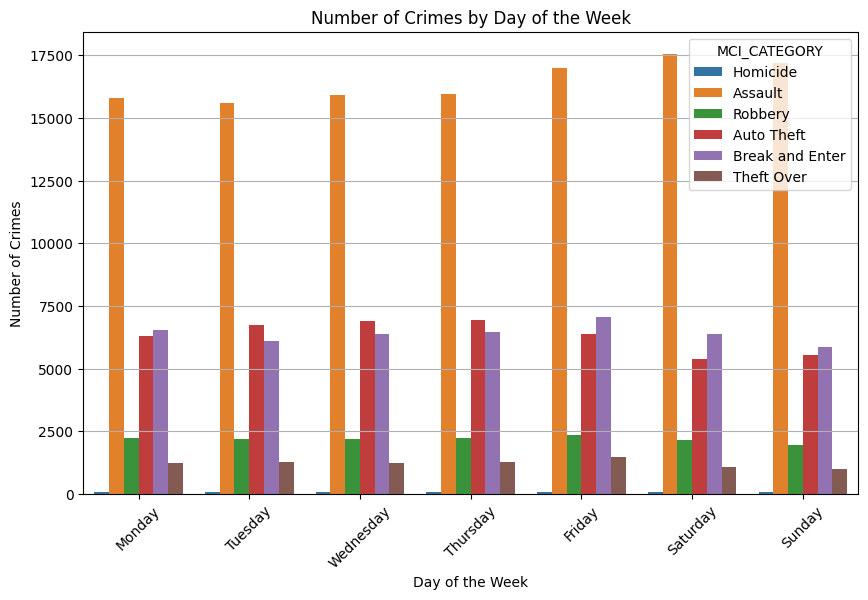

In [113]:
# Crime  by day of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_DOW',order=day_order,hue='MCI_CATEGORY')
plt.title('Number of Crimes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

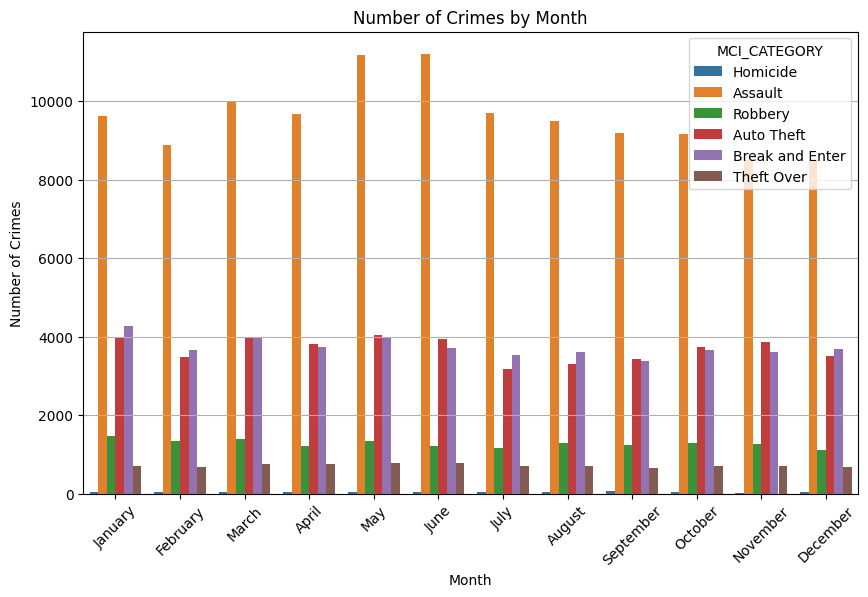

In [116]:
# Crimes by month

plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_MONTH',hue='MCI_CATEGORY')
plt.title('Number of Crimes by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

In [117]:
crimeDf.isnull().sum()

OBJECTID               0
EVENT_UNIQUE_ID        0
OCC_DATE               0
OCC_YEAR               0
OCC_MONTH              0
OCC_DAY                0
OCC_DOW                0
OCC_DOY                0
OFFENCE                0
MCI_CATEGORY           0
OCC_HOUR             226
LONG_WGS84             0
LAT_WGS84              0
HOOD_158               0
NEIGHBOURHOOD_158      0
OCC_TIME_RANGE       226
dtype: int64

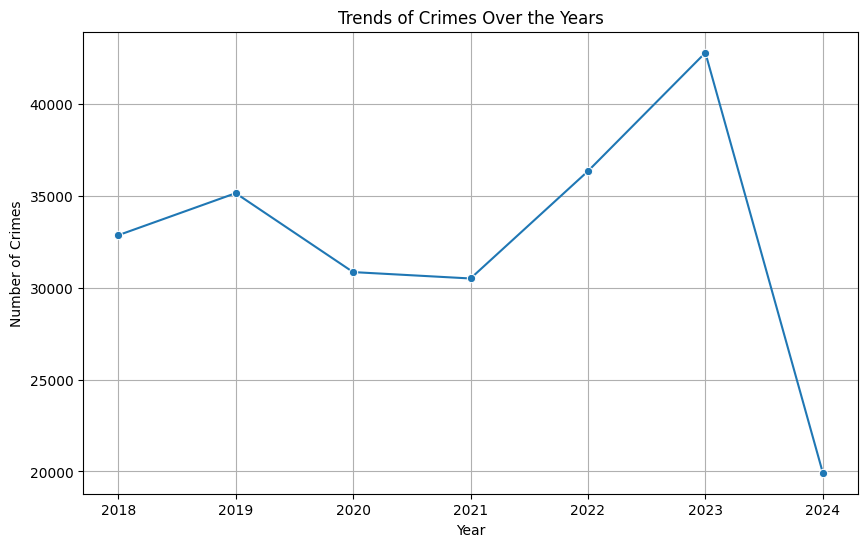

In [118]:
# Number of crime changes over the years
yearly_crime_counts = crimeDf['OCC_YEAR'].value_counts().sort_index()

# Create the line plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_crime_counts, marker='o')
plt.title('Trends of Crimes Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.xticks(yearly_crime_counts.index)
plt.grid()
plt.show()

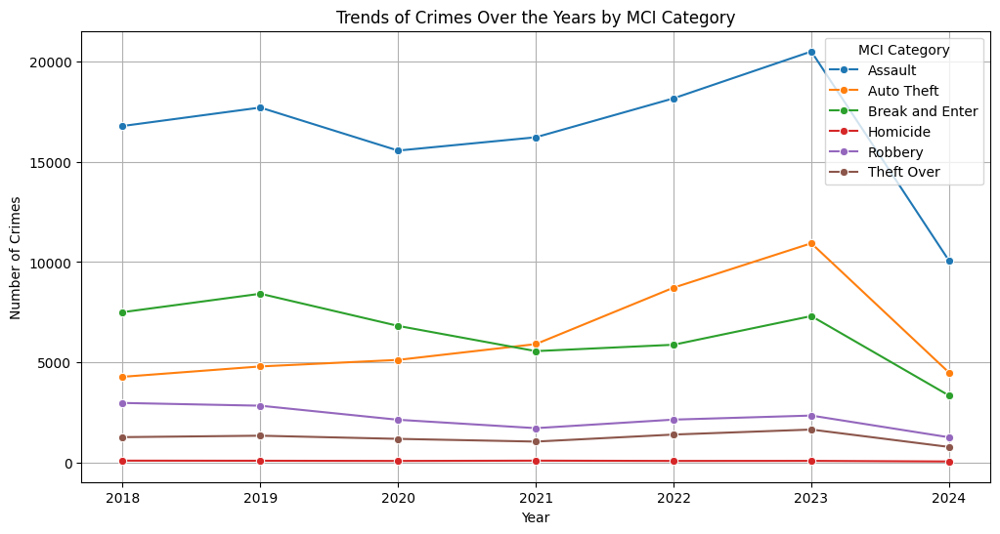

In [119]:
#trends by mci over the years
yearly_crime_counts = crimeDf.groupby(['OCC_YEAR', 'MCI_CATEGORY']).size().reset_index(name='Count')

# Create the line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_crime_counts, x='OCC_YEAR', y='Count', hue='MCI_CATEGORY', marker='o')
plt.title('Trends of Crimes Over the Years by MCI Category')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.grid()
plt.legend(title='MCI Category')
plt.show()

In [122]:
crimeDf['NEIGHBOURHOOD_158'].unique()

array(['Willowridge-Martingrove-Richview (7)',
       'Humber Heights-Westmount (8)',
       'Eringate-Centennial-West Deane (11)', 'Church-Wellesley (167)',
       'Bayview Village (52)', 'Centennial Scarborough (133)',
       'Casa Loma (96)', 'Black Creek (24)', 'Fenside-Parkwoods (150)',
       'Mount Olive-Silverstone-Jamestown (2)', 'Yorkdale-Glen Park (31)',
       'Wexford/Maryvale (119)', 'Old East York (58)',
       'Kennedy Park (124)', 'Avondale (153)',
       'Birchcliffe-Cliffside (122)', 'Princess-Rosethorn (10)',
       'Yonge-Bay Corridor (170)', 'Morningside (135)', 'Annex (95)',
       'Broadview North (57)', 'East End-Danforth (62)',
       'Malvern West (145)', 'Downtown Yonge East (168)',
       'New Toronto (18)', 'Little Portugal (84)',
       'West Queen West (162)', 'Roncesvalles (86)', 'Cliffcrest (123)',
       'Rosedale-Moore Park (98)', 'Thistletown-Beaumond Heights (3)',
       'Englemount-Lawrence (32)', 'Moss Park (73)',
       'Kensington-Chinatown (78

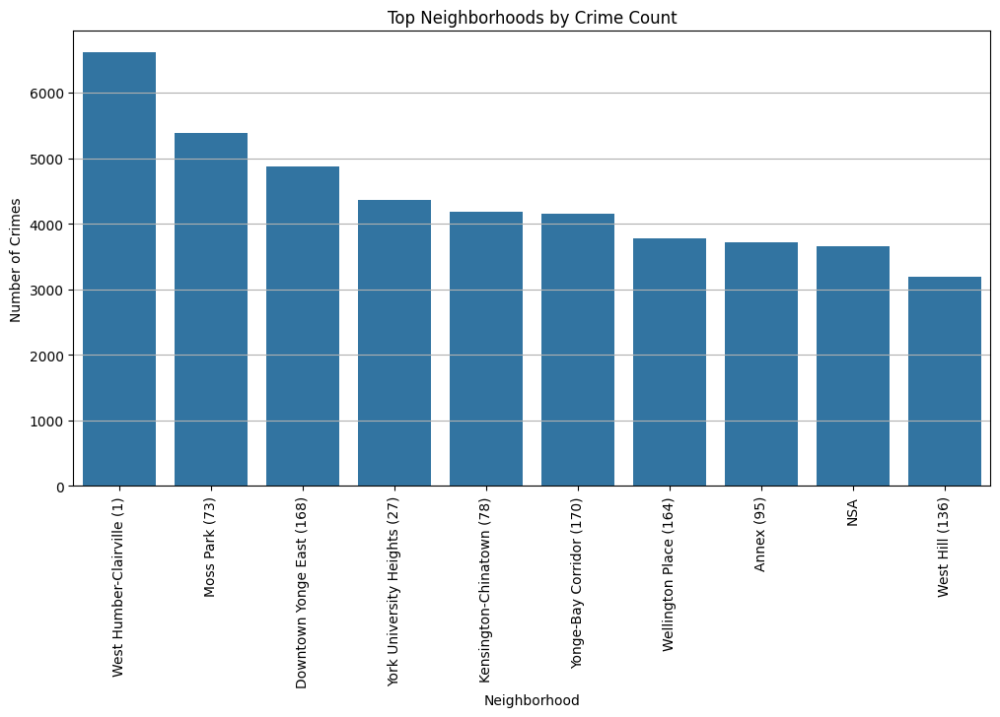

In [130]:
#Neighourhoood with most crimes
neighborhood_crime_counts = crimeDf['NEIGHBOURHOOD_158'].value_counts()


top_n = 10  
top_neighborhoods = neighborhood_crime_counts.nlargest(top_n)


plt.figure(figsize=(12, 6))
sns.barplot(x=top_neighborhoods.index, y=top_neighborhoods.values)
plt.title('Top Neighborhoods by Crime Count')
plt.xlabel('Neighborhood')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [ ]:
#lets try to impute the missing occ_hour
#one thing we know is that the records having null values in occ_hour all come from homicide dataset as that dataset did not have occ_hour col.
#So for the records with missing occ_hour, impute the values with mode of the corresponding month
# If the missing value has january as the month. then look for other records having homicide in mci_category and january in occ_month. then for those records find the mode for occ_hour and  impute it

In [133]:
# Group by OCC_MONTH and find the mode of OCC_HOUR for Homicide
mode_by_month = crimeDf[crimeDf['MCI_CATEGORY'] == 'Homicide'].groupby('OCC_MONTH')['OCC_HOUR'].agg(lambda x: x.mode()[0] if not x.mode().empty else None)

# Create a mapping from OCC_MONTH to the corresponding mode of OCC_HOUR
mode_mapping = mode_by_month.to_dict()

# Impute missing OCC_HOUR based on the OCC_MONTH mode
def impute_hour(row):
    if pd.isna(row['OCC_HOUR']):
        return mode_mapping.get(row['OCC_MONTH'], None)
    return row['OCC_HOUR']

crimeDf['OCC_HOUR'] = crimeDf.apply(impute_hour, axis=1)

C:\Users\ghema\AppData\Local\Temp\ipykernel_11796\3983003384.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf['OCC_HOUR'] = crimeDf.apply(impute_hour, axis=1)


In [135]:
# also we need to categorize them to time range
def categorize_time(hour):
    if pd.isna(hour):
        return np.nan
    elif 21 <= hour < 24 or 0 <= hour < 4:
        return 'Night'
    elif 4 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    else:
        return 'Evening'


In [136]:
crimeDf['OCC_TIME_RANGE'] = crimeDf['OCC_HOUR'].apply(categorize_time)

C:\Users\ghema\AppData\Local\Temp\ipykernel_11796\2682957048.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf['OCC_TIME_RANGE'] = crimeDf['OCC_HOUR'].apply(categorize_time)


In [139]:
crimeDf.isnull().sum()

OBJECTID             0
EVENT_UNIQUE_ID      0
OCC_DATE             0
OCC_YEAR             0
OCC_MONTH            0
OCC_DAY              0
OCC_DOW              0
OCC_DOY              0
OFFENCE              0
MCI_CATEGORY         0
OCC_HOUR             0
LONG_WGS84           0
LAT_WGS84            0
HOOD_158             0
NEIGHBOURHOOD_158    0
OCC_TIME_RANGE       0
dtype: int64